#Script Assignment 2
#Angel Argueta, Creston Altiere, Sahar Sheikholeslami , Wessley Dennis

## ▚▚ Data Collection ▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚
##1. Data Collection: Use any publicly available dataset containing a collection of technology-related news articles in a JSON format. Load the dataset and inspect its structure.

### Importing Necessary libraries

In [1]:
pip install numpy

In [2]:
pip install langid

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 17.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langid: filename=langid-1.1.6-py3-none-any.whl size=1941172 sha256=7ad2a47d3014bb42294c07b3777f25dbf7cf0b468ed93d9b911f9d2c2c9483fb
  Stored in directory: /root/.cache/pip/wheels/23/c8/c6/eed80894918490a175677414d40bd7c851413bbe03d4856c3c
Successfully built langid


In [3]:
pip install pyLDAvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 50.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.4/345.4 kB 18.7 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
bigframes 0.20.1 requires pandas<2.1.4,>=1.5.0, but you have pandas 2.2.0 which is incompatible.
google-colab 1.0.0 requires pandas==1.5.3, but you have pandas 2.2.0 which is incompatible.


In [4]:
pip install --upgrade ipykernel


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.1/116.1 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.6 MB/s eta 0:00:00
  Attempting uninstall: pyzmq
    Found existing installation: pyzmq 23.2.1
    Uninstalling pyzmq-23.2.1:
      Successfully uninstalled pyzmq-23.2.1
  Attempting uninstall: ipykernel
    Found existing installation: ipykernel 5.5.6
    Uninstalling ipykernel-5.5.6:
      Successfully uninstalled ipykernel-5.5.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires ipykernel==5.5.6, but you have ipykernel 6.29.2 which is incompatible.
google-colab 1.0.0 requires pandas==1.5.3, but you have pandas 2.2.0 which is incompatible.
notebook 6.5.5 requires pyzmq<25,>=17, but you have pyzmq 25.1.2 which is incom

In [5]:
import nltk
import pandas as pd
import numpy as np
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
import json
import langid
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import spacy
import pyLDAvis
import pyLDAvis.gensim
from IPython.core.display import HTML
from nltk.stem.lancaster import LancasterStemmer
import string
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib
import seaborn as sns
import gensim.corpora as corpora


In [9]:
# from google.colab import drive
# drive.mount('/content/drive')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


MessageError: Error: credential propagation was unsuccessful

In [12]:
import os
# os.chdir('/content/drive/MyDrive/NatrualLanguageProcessing')
os.chdir('/content')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [13]:

# Loading json
with open('Science_Technology_News.json', encoding='utf-8') as f:
    data = json.load(f)

# Main dataframe
df = pd.json_normalize(data)

# Printing Main dataframe structure
print(df.info())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5437 entries, 0 to 5436
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   title             5437 non-null   object
 1   link              5437 non-null   object
 2   keywords          2502 non-null   object
 3   creator           2610 non-null   object
 4   video_url         0 non-null      object
 5   description       4936 non-null   object
 6   content           1627 non-null   object
 7   pubDate           5437 non-null   object
 8   full_description  2670 non-null   object
 9   image_url         2169 non-null   object
 10  source_id         5437 non-null   object
dtypes: object(11)
memory usage: 467.4+ KB
None


In [14]:
df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


,title,link,keywords,creator,video_url,description,content,pubDate,full_description,image_url,source_id
0,OPPO Reno6 5G Recensione: uno smartphone elega...,https://tech.everyeye.it/articoli/recensione-o...,[Oppo Reno6],[Andrea Zanettin],None,OPPO Reno6 5G è un dispositivo che farà piacer...,None,2021-10-26 09:12:00,None,https://images.everyeye.it/img-articoli/oppo-r...,everyeye
1,Un artista smonta Xiaomi MIX Fold: il risultat...,https://gizchina.it/2021/10/xiaomi-mi-mix-fold...,"[Notizie, Xiaomi, XIAOMI, Xiaomi Mi MIX Fold, ...",[Michele Perrone],None,Uno smartphone pieghevole come Xiaomi MIX Fold...,Uno smartphone pieghevole come Xiaomi MIX Fold...,2021-10-26 09:11:35,Uno smartphone pieghevole come Xiaomi MIX Fold...,None,gizchina
2,"WHO: Staaten nicht in der Lage, Pandemie bald ...",https://futurezone.at/science/who-corona-covid...,[Science],None,None,Laut Expertenbericht der Weltgesundheitsorgani...,None,2021-10-26 09:07:32,None,https://image.futurezone.at/images/original/64...,futurezone
3,Google Pay már az Erste Banknál is,https://www.hwsw.hu/hirek/63921/erste-bank-goo...,None,[HWSW],None,Mától a magyar Erste Bank kártyáival is elérhe...,Mától a magyar Erste Bank kártyáival is elérhe...,2021-10-26 09:05:54,Mától az Erste Bank kártyáival is elérhető a G...,None,hwsw
4,Antipasto di Black Friday su Amazon: che scont...,https://tech.everyeye.it/notizie/antipasto-bla...,[Volantino e Offerte Tech],[Alessio Marino],None,Amazon ci dà un antipasto del Black Friday con...,None,2021-10-26 09:05:00,None,https://images.everyeye.it/img-notizie/antipas...,everyeye


In [15]:
df.tail()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


,title,link,keywords,creator,video_url,description,content,pubDate,full_description,image_url,source_id
5432,The creators of No Extra Heroes grow to be a p...,https://thenewstrace.com/the-creators-of-no-ex...,[Tech],[Kim Diaz],None,Suda51 welcomes the deal and is assured that i...,None,2021-10-24 09:49:36,NaN,None,thenewstrace
5433,"Référence des antivirus sur Mac, Intego sabre ...",https://www.journaldugeek.com/2021/10/24/refer...,"[Offres, Bons plans]",[Redac JDGe],None,"Ce week-end, on retrouve la même offre chez In...",None,2021-10-24 09:45:46,None,None,journaldugeek
5434,Roblox ha raggiunto 3 miliardi di account crea...,http://multiplayer.it/notizie/roblox-ha-raggiu...,None,None,None,Roblox continua a crescere e ha recentemente r...,None,2021-10-24 09:43:34,Roblox si conferma sempre più il gioco dei rec...,None,multiplayer
5435,Pożar drewnianej parafii w Studzienicznej,https://wiadomosci.onet.pl/bialystok/pozar-dre...,None,None,None,None,- Praktycznie cały budynek plebanii uległ spal...,2021-10-24 09:42:02,NaN,None,wiadomosci
5436,"Mesajul WhatsApp pentru Oameni, ce NU Stiau ca...",https://www.idevice.ro/2021/10/24/mesajul-what...,"[aplicatii, important, Noutati, tehnologie, Wh...",[Adrian Gabor],None,WhatsApp transmite un nou mesaj oficial import...,None,2021-10-24 09:40:40,NaN,None,idevice


In [16]:
df.describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


,title,link,keywords,creator,video_url,description,content,pubDate,full_description,image_url,source_id
count,5437,5437,2502,2610,0,4936,1627,5437,2670,2169,5437
unique,5255,5434,1661,942,0,4799,1589,4598,2651,2110,292
top,Social Media: Weitere interne Dokumente verstä...,https://9to5google.com/2021/10/25/pixel-6-pro-...,[Tech],[Kim Diaz],NaN,… Read More,(Auf https://www.watson.ch lesen),2021-10-25 16:00:00,L' annonce d’un partenariat entre le français ...,https://www.lastampastatic.it/cless/lastampa/2...,google
freq,6,2,119,44,NaN,16,6,33,2,17,382


In [17]:
## Make a copy before we start working with original dataset

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [18]:
dfcopy=df.copy()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [19]:
df.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


(5437, 11)

### As it can be seen above we have about 200 duplicate values beyween descriptions and titles

### Drop Duplicates
### See which descriptions are idendential

In [20]:
df = df.drop_duplicates('description', keep='last')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [21]:
df.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


(4800, 11)

In [22]:
df = df.drop_duplicates('title', keep='last')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [23]:
df.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


(4746, 11)

### Data sized was reduce by almost 600  by removing duplicates

### Study N/A Values

In [24]:
num_none_col1 = df.isna().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [25]:
print(num_none_col1)

title                  0
link                   0
keywords            2341
creator             2422
video_url           4746
description            1
content             3582
pubDate                0
full_description    2343
image_url           2804
source_id              0
dtype: int64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


### Looking at above we can drop video_url feature as it is almost entirely N/A.  Rewt of data such as content and creator keywords etc have a larger amount of missing data.  I think since the description and title matter the most the rows that have both can remain

### Pubdate scales seem to vary too much from cell. Lets study

In [26]:
df['pubDate'].describe()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


count                    4746
unique                   4145
top       2021-10-25 16:00:00
freq                       25
Name: pubDate, dtype: object

### as it can be seen above this data has over 4100 unique features. This col is not very dependant on others. Think of this like employee id etc. A number that does not carry a meanging

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:1281: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(aggregator, agg_var)


<Axes: ylabel='pubDate'>

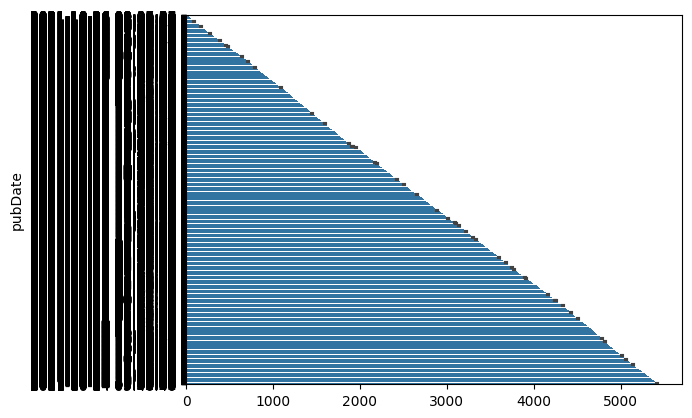

In [27]:
sns.barplot(df['pubDate'])


## ▚▚ Information Extraction ▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚
## 2. Information Extraction: Extract relevant information from each news article, such as the title, publication date, author, and content. Clean and preprocess the text data by removing stopwords, and punctuation, and performing stemming or lemmatization.

In [28]:
# 2. Information Extraction -----------------------------------------------------------------

# Extracting relevant fields
df = df[['title', 'description']].copy()

# Filtering out non-English articles ------------------------------------------
def englishfilter(text):
    if pd.isna(text):
        return "other"
    else:
        return langid.classify(text)[0]
df['language'] = df['description'].apply(englishfilter)
df = df[df['language'] == 'en']
df.drop('language', axis=1, inplace=True)
#-----------------------------------------------------------------------------



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request
<ipython-input-28-f9054962728d>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('language', axis=1, inplace=True)


In [29]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet') # we will use wordnet lemmatizer
nltk.download('averaged_perceptron_tagger') #to be used for tagger
nltk.download('punkt')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [30]:

# Preprocessing
from nltk.stem.lancaster import LancasterStemmer
import string
from nltk.corpus import wordnet
stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')
tokenizer = RegexpTokenizer(r'\w+')
lemmatizer = WordNetLemmatizer()


def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].lower()
    tag_dict = {"a": wordnet.ADJ,
                "n": wordnet.NOUN,
                "v": wordnet.VERB,
                "r": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)
def preprocess(text):
      # Check characters to see if they are in punctuation


    if text:

        text1 = [char for char in text if char not in string.punctuation]
          ## Get the numbers out
        text1 = [c for c in text1 if not c.isdigit()]


        # Join the characters again to form the string.
        text1 = ''.join(text1)
        # output = ''.join(c for c in text if not c.isdigit())

    #Tokenization

        tokens = tokenizer.tokenize(text1.lower())
        extrawords = ["th", "one","two", "g", "de", "got", "go","q","k",]
        stop_words.extend(extrawords)

        filtered_tokens = [word for word in tokens if word not in stop_words]
        stemmed_tokens = [stemmer.stem(word) for word in filtered_tokens]
        return " ".join(stemmed_tokens)
    return ""

def preprocess_lemmatize(text):
    if text:
        tokens = tokenizer.tokenize(text.lower())
        filtered_tokens = [word for word in tokens if word not in stop_words]
        lemmed_tokens = [lemmatizer.lemmatize(word, pos=get_wordnet_pos(word)) for word in filtered_tokens]
        return " ".join(lemmed_tokens)
    return ""





/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [31]:
df['AllText'] = df['title'] + ' ' +  df['description']

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [32]:
# Applying preprocessing to content field
df['processed_content_stemmed'] = df['AllText'].apply(preprocess)

# Applying preprocessing to content field
df['processed_content_lemmed'] = df['processed_content_stemmed'].apply(preprocess_lemmatize)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [33]:
df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


,title,description,AllText,processed_content_stemmed,processed_content_lemmed
5,Top tips: How to keep black clothes looking th...,“Everyone I know has a closet full of black cl...,Top tips: How to keep black clothes looking th...,top tip keep black cloth look best longer ever...,top tip keep black cloth look best longer ever...
17,Phone and internet lines down after Sudan mili...,Telecommunications have been interrupted in Su...,Phone and internet lines down after Sudan mili...,phone internet line sudan militari coup teleco...,phone internet line sudan militari coup teleco...
19,TLcom and 4DX drive $13.1M seed round to scale...,African automotive company Autochek has secure...,TLcom and 4DX drive $13.1M seed round to scale...,tlcom dx drive seed round scale autochek platf...,tlcom dx drive seed round scale autochek platf...
22,Can an app help the homeless?,How can a mobile app make life better for a pe...,Can an app help the homeless? How can a mobile...,app help homeless mobil app make life better p...,app help homeless mobil app make life well per...
25,SpaceX’s newest Crew Dragon spacecraft arrives...,"Right on schedule, SpaceX has rolled a new Cre...",SpaceX’s newest Crew Dragon spacecraft arrives...,spacex newest crew dragon spacecraft arriv lau...,spacex newest crew dragon spacecraft arriv lau...


In [34]:
# Printing Main dataframe structure
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 2012 entries, 5 to 5432
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   title                      2012 non-null   object
 1   description                2012 non-null   object
 2   AllText                    2012 non-null   object
 3   processed_content_stemmed  2012 non-null   object
 4   processed_content_lemmed   2012 non-null   object
dtypes: object(5)
memory usage: 94.3+ KB
None


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [35]:
# Printing preprocessed content
print(df['processed_content_stemmed'].head())
print(df['processed_content_lemmed'].tail())

5     top tip keep black cloth look best longer ever...
17    phone internet line sudan militari coup teleco...
19    tlcom dx drive seed round scale autochek platf...
22    app help homeless mobil app make life better p...
25    spacex newest crew dragon spacecraft arriv lau...
Name: processed_content_stemmed, dtype: object
5411    longterm test introduct outland phev black edi...
5412    xbox game studio spotlight tango gamework meet...
5419    sunday paper sunday near heart attack toaster ...
5423    look insid appl silicon playbook appl exec tal...
5432    creator extra hero grow part chine languag cor...
Name: processed_content_lemmed, dtype: object


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [36]:
## Topic Modeling ----------------------------------------------------------------------------------------------------------

# Restructuring of the data is nessecary
# will be using the lammetized data (better for topic modeling)
# will be dropping all Nan values for data uniformity
# will be combining titles, dates, etc for training
unframed_data= df['processed_content_stemmed'].dropna().values.tolist()
# unframed_data = df.drop(["content", "processed_content_stemmed"], axis=1).dropna().values.tolist()

# set up text_corpus
# text_corpus = []
new_article = []

for article in unframed_data:
    # new_article = []
    new_article.append(article.split(" "))
    # print(new_article)
    # new_article = new_article + article[1].split(" ")
    # new_article = new_article + article[2][0].split(" ")
    # new_article = new_article[0] + article[3].split(" ")
    # text_corpus.append(new_article)

# suppressed, for debugging purposes only
# print(text_corpus[0])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [37]:
new_article[:1]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


[['top',
  'tip',
  'keep',
  'black',
  'cloth',
  'look',
  'best',
  'longer',
  'everyon',
  'know',
  'closet',
  'full',
  'black',
  'cloth',
  'wrote',
  'late',
  'writer',
  'director',
  'nora',
  'ephron',
  'essay',
  'call',
  'mainten',
  'like',
  'propag',
  'clich',
  'request',
  'tip',
  'prevent',
  'black',
  'cloth',
  'fade',
  'far',
  'outnumb',
  'other',
  'seri',
  'expert',
  'advic',
  'maintain',
  'black',
  'item',
  'wardrob',
  'ephron',
  'wrote',
  'black',
  'make',
  'life',
  'much',
  'simpler',
  'everyth',
  'match',
  'black',
  'especi',
  'black',
  'wash',
  'less',
  'care',
  'salli',
  'hugh',
  'founder',
  'kair',
  'laundri',
  'product',
  'say',
  'prevent',
  'black',
  'cloth',
  'fade',
  'wash',
  'machin',
  'set',
  'key',
  'want',
  'agit',
  'garment',
  'littl',
  'possibl',
  'recommend',
  'turn',
  'garment',
  'insid',
  'wash',
  'cold',
  'gentl',
  'cycl',
  'liquid',
  'deterg',
  'avoid',
  'tumbl',
  'dri',
  '

In [38]:
# Perform mapping of ID to words
id2word = corpora.Dictionary(new_article)

corpus = []
for article in new_article:
    new = id2word.doc2bow(article)
    corpus.append(new)

print (corpus[0][0:20])

word = id2word[[0][:1][0]]
print (word)




/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


[(0, 2), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 2), (7, 1), (8, 1), (9, 1), (10, 5), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1)]
absorb


## ▚▚ Topic Modeling ▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚
## Topic Modeling: Use Latent Dirichlet Allocation (LDA) to perform topic modeling on the preprocessed text data. Determine the optimal number of topics based on coherence scores or another appropriate metric. Visualize the topics and the distribution of articles among them.

## Making our base model with a uess n

In [39]:
from gensim import matutils, models, utils

lda_model = models.LdaMulticore(corpus=corpus,
                                      id2word=id2word,
                                      num_topics=30,
                                      random_state=100,
                                      chunksize=100,
                                      passes=10,
                                      per_word_topics=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [40]:
from pprint import pprint

# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())


[(2,
  '0.068*"facebook" + 0.038*"media" + 0.036*"social" + 0.034*"watch" + '
  '0.032*"galaxi" + 0.027*"leak" + 0.023*"next" + 0.022*"launch" + '
  '0.020*"news" + 0.019*"india"'),
 (12,
  '0.104*"life" + 0.047*"resid" + 0.042*"studi" + 0.031*"link" + '
  '0.030*"scienc" + 0.030*"research" + 0.028*"univers" + 0.025*"ancient" + '
  '0.018*"scientist" + 0.015*"highest"'),
 (13,
  '0.040*"pc" + 0.035*"piec" + 0.027*"c" + 0.023*"gamer" + 0.022*"classic" + '
  '0.021*"p" + 0.021*"j" + 0.020*"fit" + 0.018*"outag" + 0.014*"manufactur"'),
 (23,
  '0.156*"googl" + 0.113*"review" + 0.080*"pixel" + 0.030*"fortnit" + '
  '0.026*"xda" + 0.024*"coverag" + 0.022*"w" + 0.022*"full" + 0.019*"news" + '
  '0.016*"skin"'),
 (25,
  '0.017*"game" + 0.017*"sunday" + 0.015*"less" + 0.014*"final" + 0.014*"year" '
  '+ 0.013*"get" + 0.012*"first" + 0.011*"second" + 0.011*"minut" + '
  '0.011*"time"'),
 (14,
  '0.073*"reveal" + 0.045*"hot" + 0.039*"bbc" + 0.033*"dark" + 0.011*"lineup" '
  '+ 0.009*"mysteri" + 0

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [41]:
lda = lda_model[corpus]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [42]:
#  most importnat topic of each record
topics=[]
for i in range(0,30):
    topic_list=[]
    for term, wt in lda_model.show_topic(i, topn=20):
        topic_list.append((term, round(wt,3)))
    topics.append(topic_list)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [43]:
df_Topic= pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics],
                         columns = ['Topic Term'],
                         index=['Topic'+str(t) for t in range(1, lda_model.num_topics+1)] )

df_Topic.head(30)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


,Topic Term
Topic1,"here, connel, quest, sixth, atmospher, killer,..."
Topic2,"news, full, googl, coverag, launch, nasa, miss..."
Topic3,"facebook, media, social, watch, galaxi, leak, ..."
Topic4,"said, govern, covid, peopl, vaccin, irish, ire..."
Topic5,"best, inperson, buy, care, black, repair, wint..."
Topic6,"india, human, rs, diwali, tablet, id, guy, col..."
Topic7,"new, would, hospit, ticket, per, power, meet, ..."
Topic8,"game, microsoft, xbox, tab, specul, stream, li..."
Topic9,"price, charg, model, amazon, batteri, men, alt..."
Topic10,"airpod, first, planet, sound, cancer, discov, ..."


## Lets Visual our topics

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request
<ipython-input-44-347368174349>:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  wc.generate(text=df_Topic["Topic Term"][i])


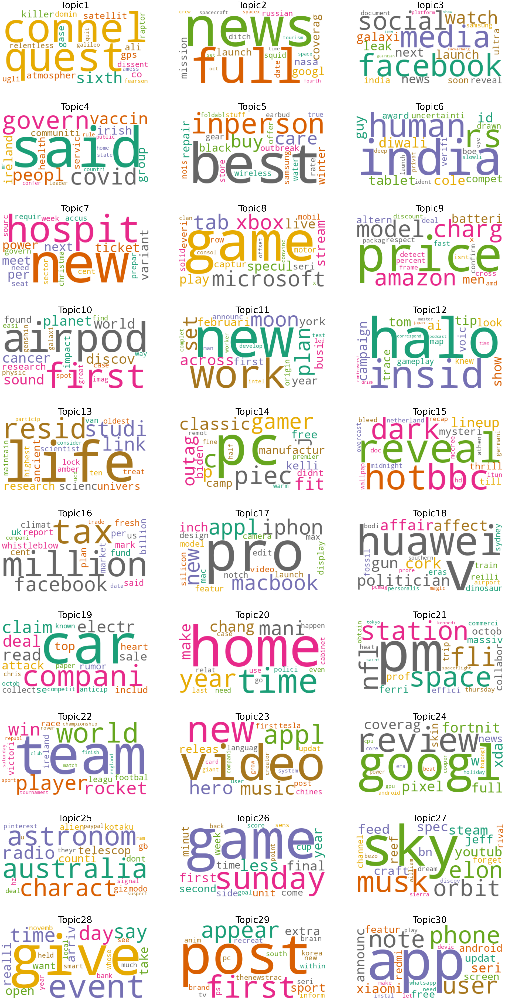

In [44]:
# import wordclouds
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# initiate wordcloud object
wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=42)




# set the figure size
plt.rcParams['figure.figsize'] = [50, 100]

# Create subplots for each topic
for i in range(30):

    wc.generate(text=df_Topic["Topic Term"][i])

    plt.subplot(10, 3, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(df_Topic.index[i], size=50)

plt.show()

## Check Model perfromance with Topic Coherence measures

In [45]:


coherence= CoherenceModel(model=lda_model, texts=new_article,
                                    dictionary=id2word, coherence='c_v')
coherence_lda = coherence.get_coherence()
print('\nlLDA Coherence Score: ', coherence_lda)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request



lLDA Coherence Score:  0.456947517568331


## Lets Visualize

In [46]:
# import pyLDAvis.gensim
import pyLDAvis.gensim_models
import pyLDAvis

pyLDAvis.enable_notebook(local=True)
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word, mds="mmds", R=30)
vis


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
19     0.187976  0.413667       1        1  18.806637
22     0.371333  0.229212       2        1   9.189355
25    -0.179034  0.403891       3        1   8.523501
3     -0.061116  0.461738       4        1   7.882483
16     0.456581 -0.114372       5        1   7.373324
10     0.412802  0.100932       6        1   7.205914
27     0.076348  0.390091       7        1   7.048993
6     -0.453085 -0.028148       8        1   4.869376
15    -0.291692  0.277403       9        1   3.782910
18     0.259834  0.236410      10        1   3.114152
2      0.319874 -0.045185      11        1   2.330043
29     0.121835  0.162183      12        1   2.253627
21    -0.392922  0.100309      13        1   2.230048
9     -0.258248  0.096231      14        1   2.208325
1      0.079910 -0.407528      15        1   1.500022
8     -0.301411 -0.112587      16        1   1.420411
28    -0.111198  0.191732      17        1   1.411139
23    -0.184351 -0.335966      18        1   1.218151
12     0.178219 -0.107210      19        1   1.051097
11     0.218642 -0.245505      20        1   1.015235
20    -0.250148 -0.221281      21        1   0.921562
13     0.116127 -0.281029      22        1   0.821782
7     -0.062485  0.048422      23        1   0.787570
24    -0.048468 -0.244129      24        1   0.628892
4     -0.081822 -0.327633      25        1   0.585204
17     0.069122 -0.141239      26        1   0.463764
5      0.001753 -0.172699      27        1   0.455664
26    -0.118774 -0.131771      28        1   0.437809
0     -0.037303 -0.113682      29        1   0.232090
14    -0.038301 -0.082255      30        1   0.230921, topic_info=        Term        Freq       Total Category  logprob  loglift
1155    game  499.000000  499.000000  Default  30.0000  30.0000
679      pro  853.000000  853.000000  Default  29.0000  29.0000
72     first  832.000000  832.000000  Default  28.0000  28.0000
913     appl  853.000000  853.000000  Default  27.0000  27.0000
838    googl  495.000000  495.000000  Default  26.0000  26.0000
...      ...         ...         ...      ...      ...      ...
9       also    0.017152  504.466289  Topic30  -9.8934  -4.2183
10     amber    0.017152   16.893034  Topic30  -9.8934  -0.8217
11    amount    0.017152   25.495568  Topic30  -9.8934  -1.2333
12     anoth    0.017152  117.914250  Topic30  -9.8934  -2.7647
13     appli    0.017152   38.348263  Topic30  -9.8934  -1.6415

[1440 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
909       7  0.968816     absolut
0         3  0.917206      absorb
1033      2  0.071091        abus
1033     10  0.888639        abus
5969     19  0.842889     academi
...     ...       ...         ...
660      28  0.928667      youtub
5035     27  0.553492          yr
1921      7  0.985066     zealand
1366     12  0.869401        zoom
2629     11  0.968445  zuckerberg

[2238 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 23, 26, 4, 17, 11, 28, 7, 16, 19, 3, 30, 22, 10, 2, 9, 29, 24, 13, 12, 21, 14, 8, 25, 5, 18, 6, 27, 1, 15])

### As it can be seen good bit of overlap between some clusters. Lets fine Tune

In [47]:
def coherence_Score(dictionary, corpus, texts, limit, start=2, step=3):


    Score = []
    modelCollection = []
    for topics in range(start, limit, step):
        model = models.LdaMulticore(corpus=corpus,
                                    num_topics=topics,
                                    id2word=id2word,
                                      random_state=100,
                                      chunksize=100,
                                      passes=10,
                                      per_word_topics=True)
        modelCollection.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        Score.append(coherencemodel.get_coherence())

    return modelCollection, Score




/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [48]:
modelCollection, Score = coherence_Score(dictionary=id2word, corpus=corpus, texts=new_article,
                                                        start=2, limit=50, step=1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


## Looking at the plot of our scores

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


Text(0, 0.5, 'Coherence score')

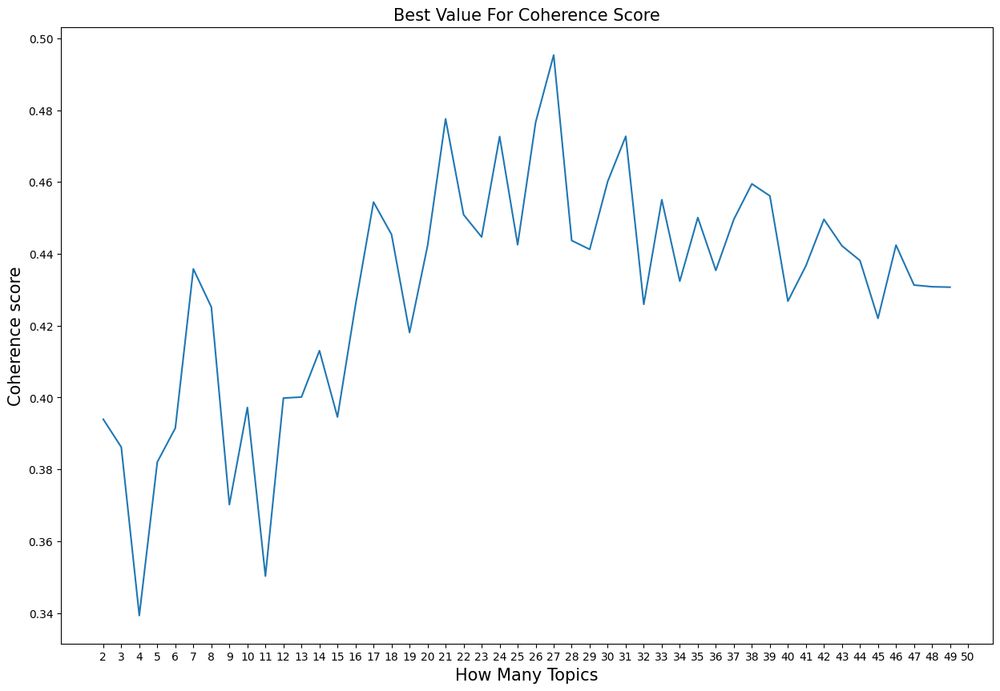

In [49]:
start=2; end=50;
plt.rcParams['figure.figsize'] = [15, 10 ]
plt.plot(range(start, end), Score)
plt.title("Best Value For Coherence Score", size=15)
plt.xticks(np.arange(2,51))
plt.xlabel("How Many Topics", size=15)
plt.ylabel("Coherence score", size=15)


In [50]:
BestScore= Score.index(max(Score))
optimal_model = modelCollection[BestScore]

print(f'''{BestScore} topics gives the highest coherence score \
of {Score[BestScore]}''')

25 topics gives the highest coherence score of 0.49532738661400466


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [51]:
pyLDAvis.enable_notebook(local=True)
vis = pyLDAvis.gensim.prepare(optimal_model, corpus, id2word, mds="mmds", R=30)
vis


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
19    -0.341504 -0.287294       1        1  24.390359
25     0.279413 -0.380445       2        1  15.886652
22    -0.078501 -0.414233       3        1  10.499454
6     -0.243384 -0.388369       4        1   7.302470
16     0.066935 -0.417269       5        1   6.716667
23    -0.399317 -0.097095       6        1   4.972721
9      0.224953 -0.230447       7        1   3.661157
15     0.369105 -0.148207       8        1   3.560751
13     0.383004  0.149338       9        1   2.907757
21     0.290269  0.354033      10        1   2.679576
10     0.064613 -0.234163      11        1   2.341483
5     -0.267431 -0.010888      12        1   2.181830
11    -0.159429 -0.175825      13        1   1.949375
20    -0.352426  0.122398      14        1   1.859081
3     -0.290742  0.302456      15        1   1.738576
4      0.369358  0.026513      16        1   1.695789
2      0.046678 -0.050380      17        1   1.040348
12     0.070909  0.309462      18        1   0.696332
18    -0.063667  0.343418      19        1   0.632547
17    -0.132663  0.234759      20        1   0.513431
24    -0.104343  0.107432      21        1   0.494972
26     0.135317  0.072412      22        1   0.469936
1      0.056521  0.123657      23        1   0.436725
7      0.128394  0.192707      24        1   0.423802
14     0.015593  0.221306      25        1   0.400050
8     -0.055863  0.169792      26        1   0.328612
0     -0.011794  0.104932      27        1   0.219547, topic_info=             Term         Freq        Total Category  logprob  loglift
913          appl   749.000000   749.000000  Default  30.0000  30.0000
838         googl   523.000000   523.000000  Default  29.0000  29.0000
679           pro   762.000000   762.000000  Default  28.0000  28.0000
435           new  1376.000000  1376.000000  Default  27.0000  27.0000
503          news   422.000000   422.000000  Default  26.0000  26.0000
...           ...          ...          ...      ...      ...      ...
13191         psx     0.016077     0.961138  Topic27  -9.9076   2.0306
9598         utah     0.016077     0.961138  Topic27  -9.9076   2.0306
4658   enthusiast     0.016077    13.552790  Topic27  -9.9076  -0.6156
6656          mar     0.016077     0.961138  Topic27  -9.9076   2.0306
7931          ctv     0.016077     0.961138  Topic27  -9.9076   2.0306

[1227 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
909      26  0.922859    absolut
1033      3  0.963469       abus
4518     12  0.916396  accompani
1419      1  0.059679    account
1419      2  0.047743    account
...     ...       ...        ...
3610     15  0.981466   youngest
1455      7  0.960785       your
3611      1  0.399717          z
3611     17  0.532956          z
908      15  0.981096       zero

[1862 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 26, 23, 7, 17, 24, 10, 16, 14, 22, 11, 6, 12, 21, 4, 5, 3, 13, 19, 18, 25, 27, 2, 8, 15, 9, 1])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request
<ipython-input-52-d9b252ec820e>:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  wc.generate(text=df_Topic["Topic Term"][i])


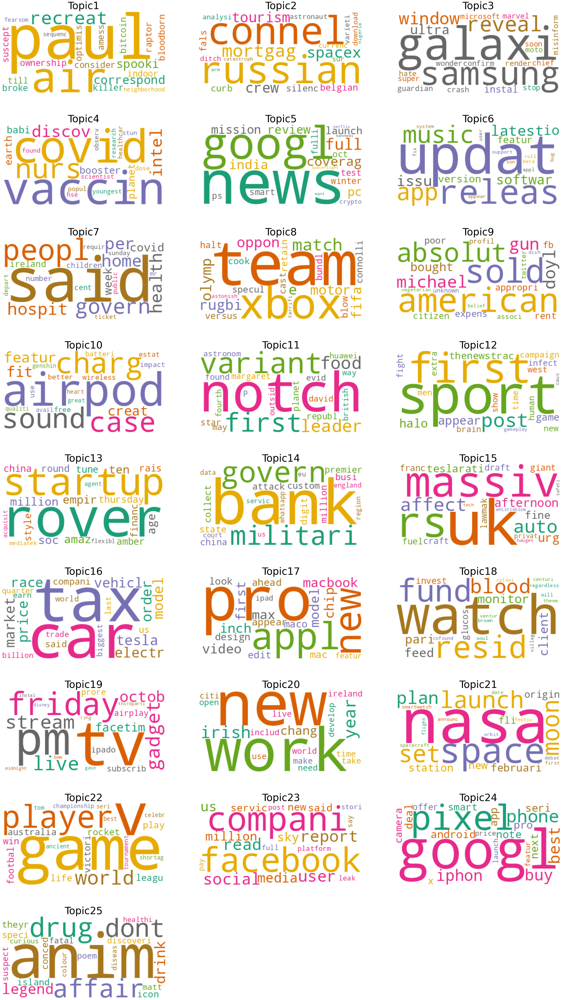

In [52]:
topics=[]
for i in range(0,BestScore):
    topic_list=[]
    for term, wt in optimal_model.show_topic(i, topn=20):
        topic_list.append((term, round(wt,3)))
    topics.append(topic_list)

df_Topic= pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics],
                         columns = ['Topic Term'],
                         index=['Topic'+str(t) for t in range(1, optimal_model.num_topics-1)] )

wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=42)




# set the figure size
plt.rcParams['figure.figsize'] = [50, 100]


for i in range(BestScore):

    wc.generate(text=df_Topic["Topic Term"][i])

    plt.subplot(10, 3, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(df_Topic.index[i], size=50)


In [62]:
lda_model_19 = models.LdaMulticore(corpus=corpus,
                                      id2word=id2word,
                                      num_topics=19,
                                      random_state=100,
                                      chunksize=100,
                                      passes=10,
                                      per_word_topics=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request


In [63]:
pyLDAvis.enable_notebook(local=True)
vis = pyLDAvis.gensim.prepare(lda_model_19, corpus, id2word, mds="mmds", R=30)
vis


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  via input_request
/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6     -0.339171 -0.254357       1        1  24.406221
9     -0.212061 -0.331356       2        1  15.008917
10    -0.351001 -0.080933       3        1  11.306245
16    -0.405005  0.085223       4        1   9.760702
3      0.145826 -0.421395       5        1   8.505335
15    -0.003877 -0.343923       6        1   5.150094
8      0.036995  0.406146       7        1   4.299147
18    -0.170181  0.255775       8        1   3.323648
0     -0.270776  0.282031       9        1   3.250471
13    -0.102577 -0.133261      10        1   3.210901
5      0.203859 -0.172994      11        1   2.320828
17     0.351868 -0.126276      12        1   1.652800
2      0.305438  0.010487      13        1   1.566522
12     0.267874  0.240899      14        1   1.518052
11    -0.019066  0.053358      15        1   1.246219
4      0.266099  0.120774      16        1   1.089779
14     0.044221  0.211603      17        1   1.010907
7      0.129388  0.167808      18        1   0.839391
1      0.122149  0.030392      19        1   0.533821, topic_info=        Term        Freq       Total Category  logprob  loglift
913     appl  818.000000  818.000000  Default  30.0000  30.0000
679      pro  845.000000  845.000000  Default  29.0000  29.0000
838    googl  490.000000  490.000000  Default  28.0000  28.0000
674  macbook  625.000000  625.000000  Default  27.0000  27.0000
339     said  862.000000  862.000000  Default  26.0000  26.0000
..       ...         ...         ...      ...      ...      ...
520  station    6.696244   75.845388  Topic19  -4.7642   2.8057
381     bank    5.225917   86.264711  Topic19  -5.0121   2.4291
65   explain    2.034439   37.823786  Topic19  -5.9555   2.3101
454    agenc    1.633696   21.737124  Topic19  -6.1749   2.6447
384  compani    2.758865  391.143852  Topic19  -5.6509   0.2786

[966 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
453       2  0.813775         abl
453       3  0.164486         abl
453       4  0.017314         abl
909       7  0.969966     absolut
1540     12  0.984535       accus
...     ...       ...         ...
5035     19  0.608319          yr
1921      2  0.088754     zealand
1921     18  0.887540     zealand
908       6  0.978100        zero
2629      8  0.965360  zuckerberg

[1551 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 10, 11, 17, 4, 16, 9, 19, 1, 14, 6, 18, 3, 13, 12, 5, 15, 8, 2])

#Topic Discussion:
##General Overview:
From our analysis we were able to determine that the optimum about of topics to achieve the best coherence score hovered between 13 on the low end and 25 on the high end. Along with the actual topic modeling one of the key findings was that, due to the nondeterministic nature of the LDA unsupervised learning method, we weren’t able to get a single optimum amount of topics. This could be due to a wide range of variables, including how the data is loaded to any initialized random variables. For our analysis, although we made multiple runs of our model and got a range of different topics, we will focus on the 19 topics as it falls within our median point.

The data was visualized using word clouds to quickly gauge what were some of the most prevalent words. Examining the data as a whole, It was not initially known what the data was, other than that it was news related. From the topics, it initially appeared to be a collection of web articles on technology from websites in Ireland and the United Kingdom. This is due to one of the topics being apparently about Irish politics, with words such as "Dublin," "tax," "cabinet." Upon examining the data, it contains technology and online business related pieces. The corpus appears to contain texts from mostly European countries like Poland and Italy, and a few from countries such as Indonesia and Japan. Since topics in other languages were filtered out, a lot of the origin points of our data may be skewed towards mostly speaking countries such as Ireland and Australia.

##Topic Exploration
Below is a small explanation of what we believe some of the topics to be:
1.	Mobile Phones
2.	Real Estate
3.	Sensational News Headlines (Incoherent)
4.	Covid 19
5.	Nature Discovery
6.	Entertainment and Travel
7.	Government Policy
8.	Technology (leisure) (Incoherent)
9.	Technology (Apps) (Policy)
10.	Technology (Apple, New)
11.	Local News (Incoherent)
12.	Esports (Entertainment Electronics/Games)
13.	Business (International) (Incoherent)
14.	Finance and Trade
15.	Twitter, Social Networks Billionaires
16.	Stock Market
17.	Apple, Technology
18.	Smart Technology, Automobiles (Incoherent)
19.	Social Media

## Discussion
The first topic appears to be largely a tech related topic, including terms such as Iphone, rocket, galaxy, ultra, GB, screen etc. Most of these terms are relevant to the mobile tech industry. Even when considering the context, Galaxy while at first glance would appear space related, especially when considering the term rocket, appears to be referring to an actual product when considering Samsung, as Samsung does make a popular phone known as the Samsung Galaxy. Topics 3, 8, 11, 13, and 18 while one could attempt to deduce a subject for, remain largely incoherent. This could be a result of when some of the data was collected and where. I think an important notion to consider when performing such modeling is that sometimes you may have a single story that is so sensational, it breaks worldwide headlines, and thus appears in a number of places.

Topics 3, 4 and 5 can actually all be explained by the covid pandemic, as it was a global issue affecting the entire planet wherein there was a rush to research a vaccine to combat it. These very terms, Research, Vaccine and Variant appear prominently in the word clouds. Topic 6 after some analysis can be considered streaming related (think of services like Netflix, etc.) as there’s a lot of terms related to streaming, i.e. subscribe, awards, Netflix, Disney.As expected, the majority of the topics like 1, 9, 10, 12, 15, 16, 17, 18, and 19 are technology or entertainment related. In these word clouds is present the names of large tech companies like Huawei, Apple, Tesla,  or prominent figures in the technology industry like Elon musk, and Jeff Bezos.

Overall, the LDA topic modeling we were able to achieve, while not perfect, was able to produce an acceptable output despite it’s nondeterministic nature. The majority of input articles were all certainly technology related news articles, and of the topics we’ve explored approximately 11 were directly technology related, 3 were covid related and the rest, business and finance related.  

